<a href="https://colab.research.google.com/github/AlirezaYsd/ml-projects/blob/main/LinearRegression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Dataset Description

The dataset for this competition (both train and test) was generated from a deep learning model trained on the Crab Age Prediction dataset. Feature distributions are close to, but not exactly the same, as the original. Feel free to use the original dataset as part of this competition, both to explore differences as well as to see whether incorporating the original in training improves model performance.

## Files

train.csv - the training dataset; Age is the target
test.csv - the test dataset; your objective is to predict the probability of Age (the ground truth is int but you can predict int or float)

# Libraries

In [ ]:
!pip install --upgrade category_encoders
!pip install --upgrade optuna
!pip install --upgrade optuna catboost


from sklearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler
import copy
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import os
from copy import deepcopy
from sklearn.preprocessing import StandardScaler
from functools import partial
from itertools import combinations
import random
import gc
import time

# Import sklearn classes for model selection, cross validation, and performance evaluation
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import seaborn as sns
from category_encoders import OrdinalEncoder, CountEncoder, CatBoostEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.under_sampling import RandomUnderSampler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.decomposition import PCA, NMF

# Import libraries for Hypertuning
import optuna

import xgboost as xgb
import lightgbm as lgb
import xgboost as xgb
import lightgbm as lgb
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, SGDRegressor, LassoCV
from sklearn.linear_model import PassiveAggressiveRegressor, ARDRegression, RidgeCV, ElasticNetCV
from sklearn.linear_model import TheilSenRegressor, RANSACRegressor, HuberRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor, GradientBoostingRegressor, VotingRegressor, StackingRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector
from sklearn.cross_decomposition import PLSRegression
from catboost import CatBoost, CatBoostRegressor, CatBoostClassifier
from catboost import Pool

!pip install sklego
from sklego.linear_model import LADRegression # Least Absolute Deviation Regression

from sklearn.feature_selection import RFE, RFECV
from sklearn.inspection import permutation_importance

# Suppress warnings
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

!pip install --upgrade colorama
from colorama import Style, Fore
blk = Style.BRIGHT + Fore.BLACK
red = Style.BRIGHT + Fore.RED
blu = Style.BRIGHT + Fore.BLUE
res = Style.RESET_ALL

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 3.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 28.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 9.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 9.4 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/sklearn/experimental/enable_hist_gradient_boosting.py:16: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.
  warnings.warn(


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 230.9/230.9 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 31.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82816 sha256=2ecf18fc1759396786cb8ad34bb9ca3232e10762ad67b53e4e8594344f64f8c0
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55622 sha256=434b89cc35ffa8594c0c64abe913bb20e0ba909705e21c3d2335a26234b6e409
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent
Look

# Data


In [ ]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

df_train['is_generated'] = 1
df_test['is_generated'] = 1

target_col = 'Age'
num_cols = df_test.select_dtypes(include=['float64']).columns.tolist()
cat_cols = df_test.select_dtypes(include=['object']).columns.tolist()

print(f"train shape :{df_train.shape}, ", f"test shape :{df_test.shape}")

train shape :(74051, 11),  test shape :(49368, 10)


# EDA
1. Train, Test and Original data histograms
2. Correlation of Features
3. Hierarchical Clustering
4. Pie and bar charts for categorical column features
5. Scatter Plot with Age Column by Sex
6. Distribution Plot by Sex
7. Boxplot by Sex
8. Violinplot by Sex
9. Scatter plots after dimensionality reduction with PCA by Sex

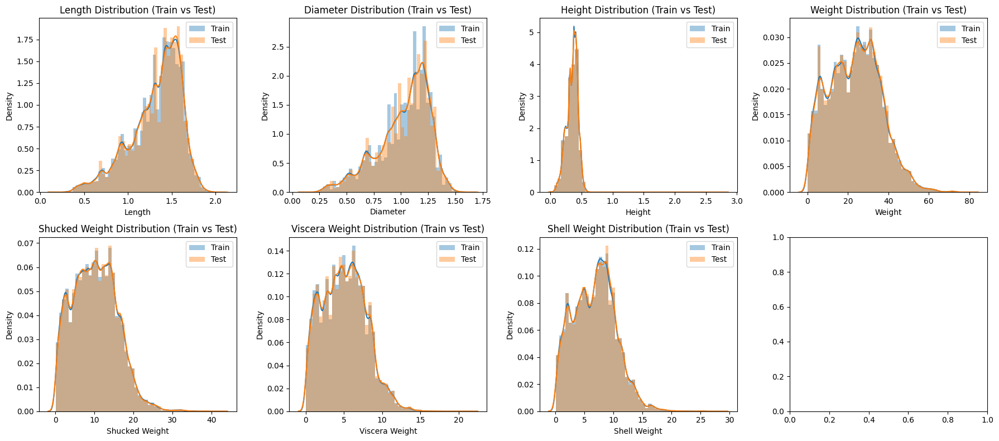

In [ ]:
def plot_histograms(df_train, df_test, target_col, n_cols=3):
    n_rows = (len(df_train.columns) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 4*n_rows))
    axes = axes.flatten()

    for i, var_name in enumerate(df_train.columns.tolist()):
        if var_name != 'is_generated':
            ax = axes[i]
            sns.distplot(df_train[var_name], kde=True, ax=ax, label='Train')
            if var_name != target_col:
                sns.distplot(df_test[var_name], kde=True, ax=ax, label='Test')
            ax.set_title(f'{var_name} Distribution (Train vs Test)')
            ax.legend()

    plt.tight_layout()
    plt.show()

plot_histograms(df_train[num_cols], df_test[num_cols], target_col, n_cols=4)

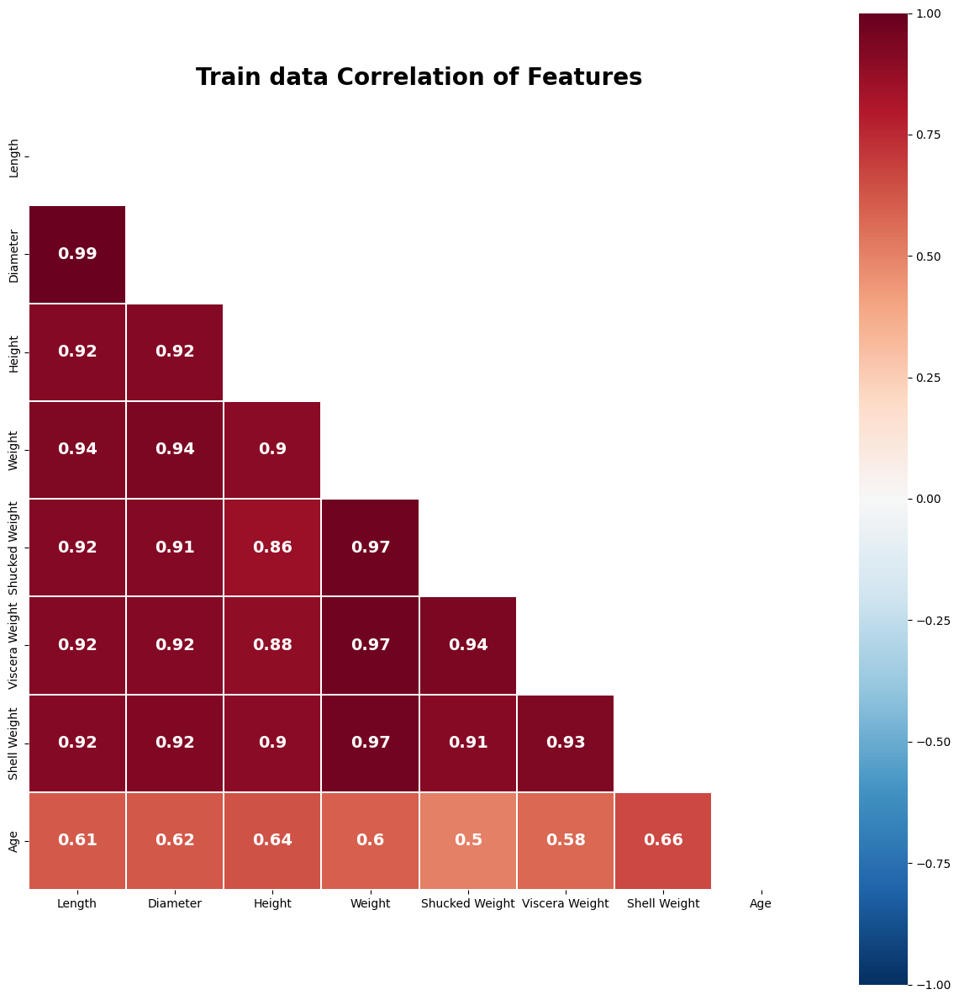

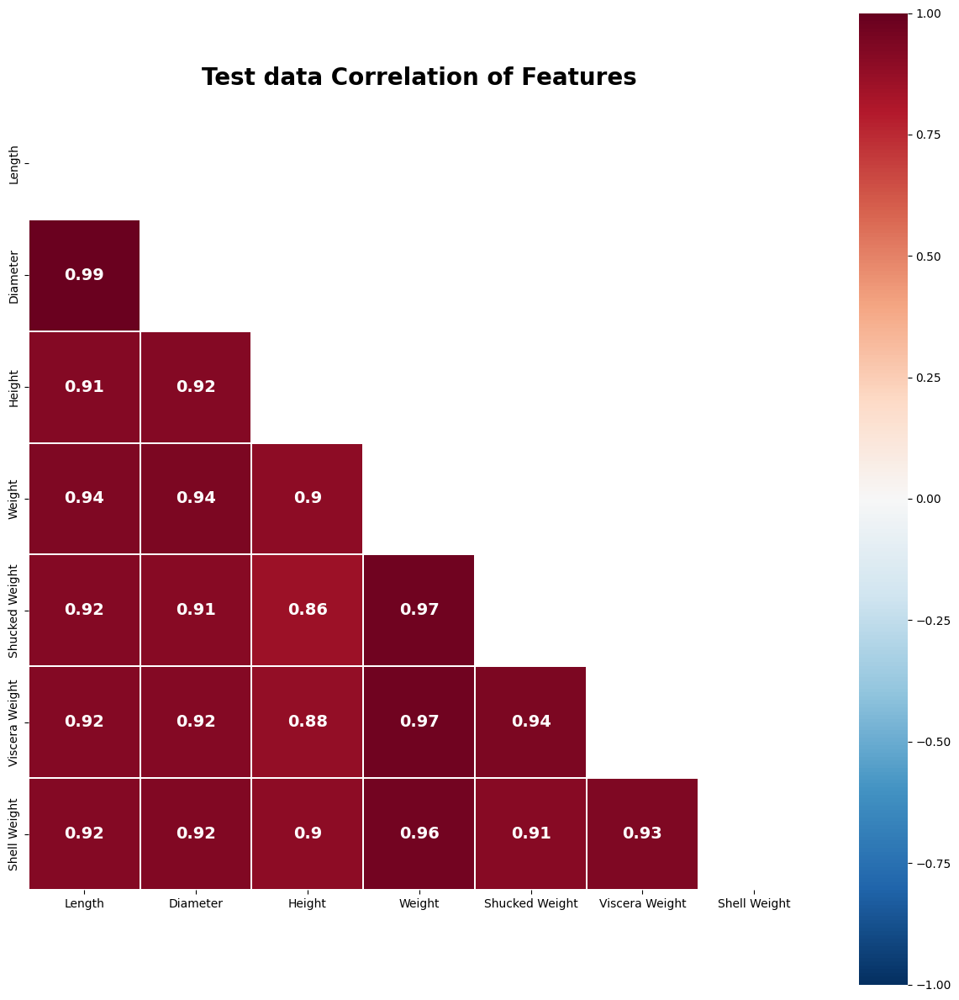

In [ ]:
def plot_heatmap(df, title):
    # Create a mask for the diagonal elements
    mask = np.zeros_like(df.astype(float).corr())
    mask[np.triu_indices_from(mask)] = True

    # Set the colormap and figure size
    colormap = plt.cm.RdBu_r
    plt.figure(figsize=(15, 15))

    # Set the title and font properties
    plt.title(f'{title} Correlation of Features', fontweight='bold', y=1.02, size=20)

    # Plot the heatmap with the masked diagonal elements
    sns.heatmap(df.astype(float).corr(), linewidths=0.1, vmax=1.0, vmin=-1.0,
                square=True, cmap=colormap, linecolor='white', annot=True, annot_kws={"size": 14, "weight": "bold"},
                mask=mask)

plot_heatmap(df_train[num_cols+[target_col]], title='Train data')
plot_heatmap(df_test[num_cols], title='Test data')

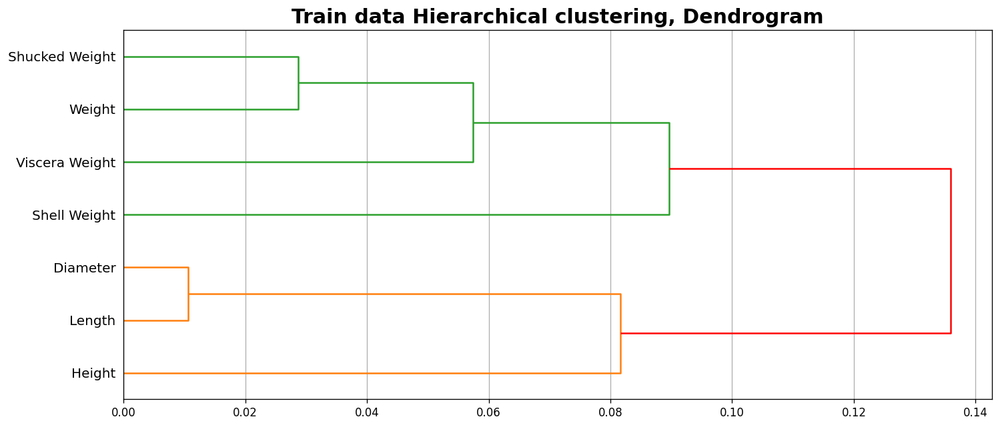

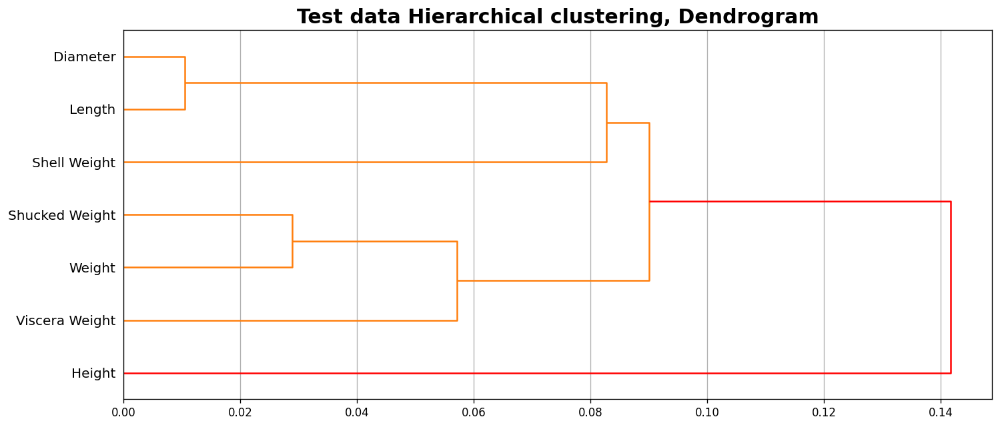

In [ ]:
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform

def hierarchical_clustering(data, title):
    fig, ax = plt.subplots(1, 1, figsize=(14, 6), dpi=120)
    correlations = data.corr()
    converted_corr = 1 - np.abs(correlations)
    Z = linkage(squareform(converted_corr), 'complete')

    dn = dendrogram(Z, labels=data.columns, ax=ax, above_threshold_color='#ff0000', orientation='right')
    hierarchy.set_link_color_palette(None)
    plt.grid(axis='x')
    plt.title(f'{title} Hierarchical clustering, Dendrogram', fontsize=18, fontweight='bold')
    plt.show()

hierarchical_clustering(df_train[num_cols], title='Train data')
hierarchical_clustering(df_test[num_cols], title='Test data')

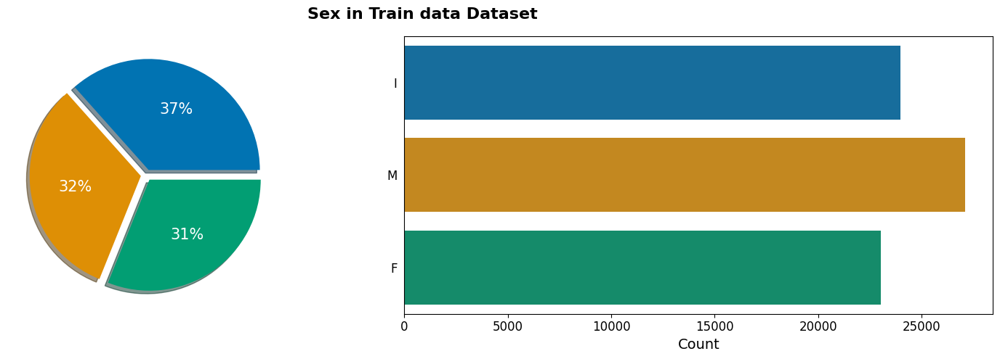

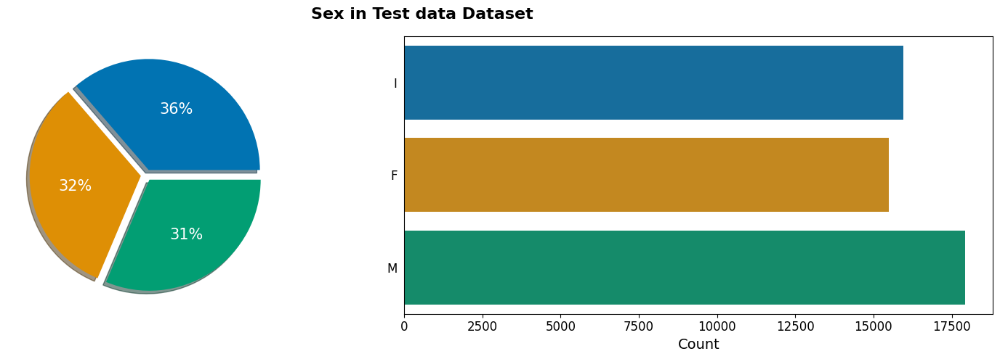

In [ ]:
def plot_target_feature(df_train, target_col, figsize=(16,5), palette='colorblind', name='Train'):
    df_train = df_train.fillna('Nan')

    fig, ax = plt.subplots(1, 2, figsize=figsize)
    ax = ax.flatten()

    # Pie chart
    pie_colors = sns.color_palette(palette, len(df_train[target_col].unique()))
    ax[0].pie(
        df_train[target_col].value_counts(),
        shadow=True,
        explode=[0.05] * len(df_train[target_col].unique()),
        autopct='%1.f%%',
        textprops={'size': 15, 'color': 'white'},
        colors=pie_colors
    )
    ax[0].set_aspect('equal')  # Fix the aspect ratio to make the pie chart circular

    # Bar plot
    bar_colors = sns.color_palette(palette)
    sns.countplot(
        data=df_train,
        y=target_col,
        ax=ax[1],
        palette=bar_colors
    )
    ax[1].set_xlabel('Count', fontsize=14)
    ax[1].set_ylabel('')
    ax[1].tick_params(labelsize=12)
    ax[1].yaxis.set_tick_params(width=0)  # Remove tick lines for y-axis

    fig.suptitle(f'{target_col} in {name} Dataset', fontsize=16, fontweight='bold')
    plt.tight_layout()

    # Show the plot
    plt.show()

plot_target_feature(df_train, 'Sex', figsize=(16,5), palette='colorblind', name='Train data')
plot_target_feature(df_test, 'Sex', figsize=(16,5), palette='colorblind', name='Test data')

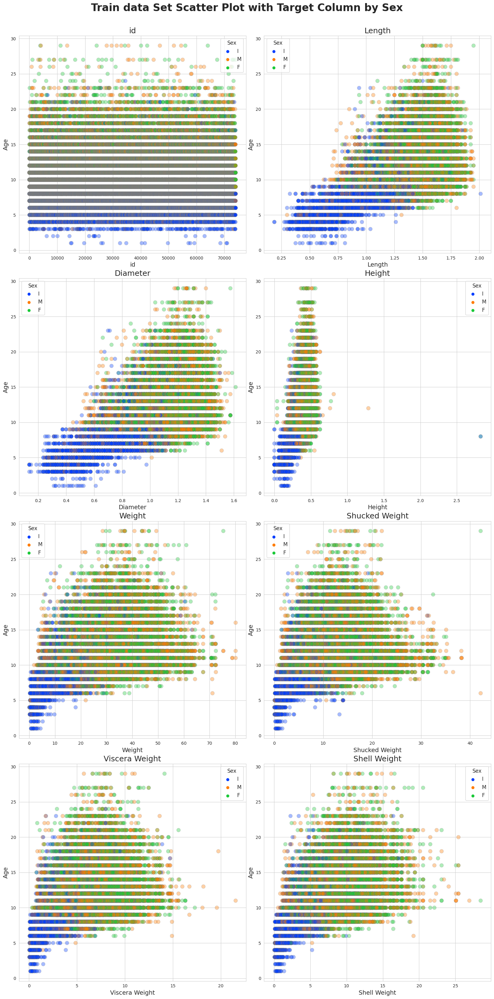

In [ ]:
def plot_scatter_with_fixed_col(df, fixed_col, hue=False, drop_cols=[], size=10, title=''):
    sns.set_style('whitegrid')

    if hue:
        cols = df.columns.drop([hue, fixed_col] + drop_cols)
    else:
        cols = df.columns.drop([fixed_col] + drop_cols)
    n_cols = 2
    n_rows = (len(cols) - 1) // n_cols + 1
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(size, size/n_cols*n_rows), sharex=False, sharey=False)
    fig.suptitle(f'{title} Set Scatter Plot with Target Column by {hue}', fontsize=24, fontweight='bold', y=1.01)

    for i, col in enumerate(cols):
        n_row = i // n_cols
        n_col = i % n_cols
        ax = axes[n_row, n_col]

        ax.set_xlabel(f'{col}', fontsize=14)
        ax.set_ylabel(f'{fixed_col}', fontsize=14)

        # Plot the scatterplot
        if hue:
            sns.scatterplot(data=df, x=col, y=fixed_col, hue=hue, ax=ax,
                            s=80, edgecolor='gray', alpha=0.35, palette='bright')
            ax.legend(title=hue, title_fontsize=12, fontsize=12) # loc='upper right'
        else:
            sns.scatterplot(data=df, x=col, y=fixed_col, ax=ax,
                            s=80, edgecolor='gray', alpha=0.35)

        ax.tick_params(axis='both', which='major', labelsize=10)
        ax.set_title(f'{col}', fontsize=18)

    plt.tight_layout(pad=0.5, h_pad=0.5, w_pad=0.5)
    plt.show()

plot_scatter_with_fixed_col(df_train, fixed_col=target_col, hue='Sex', drop_cols=['is_generated'], size=16, title='Train data')

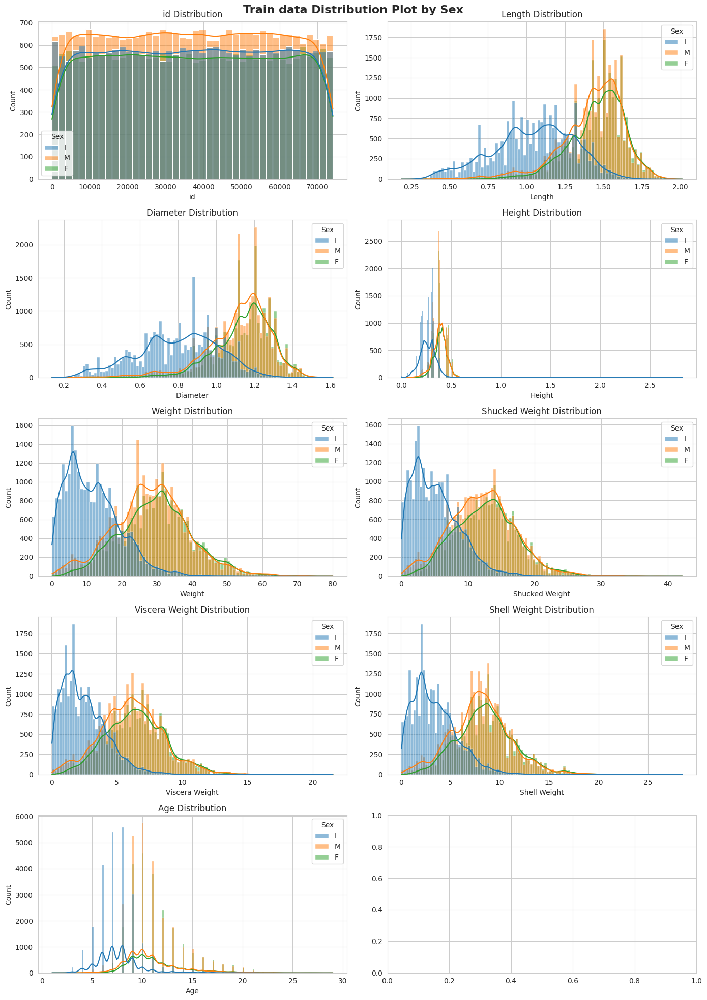

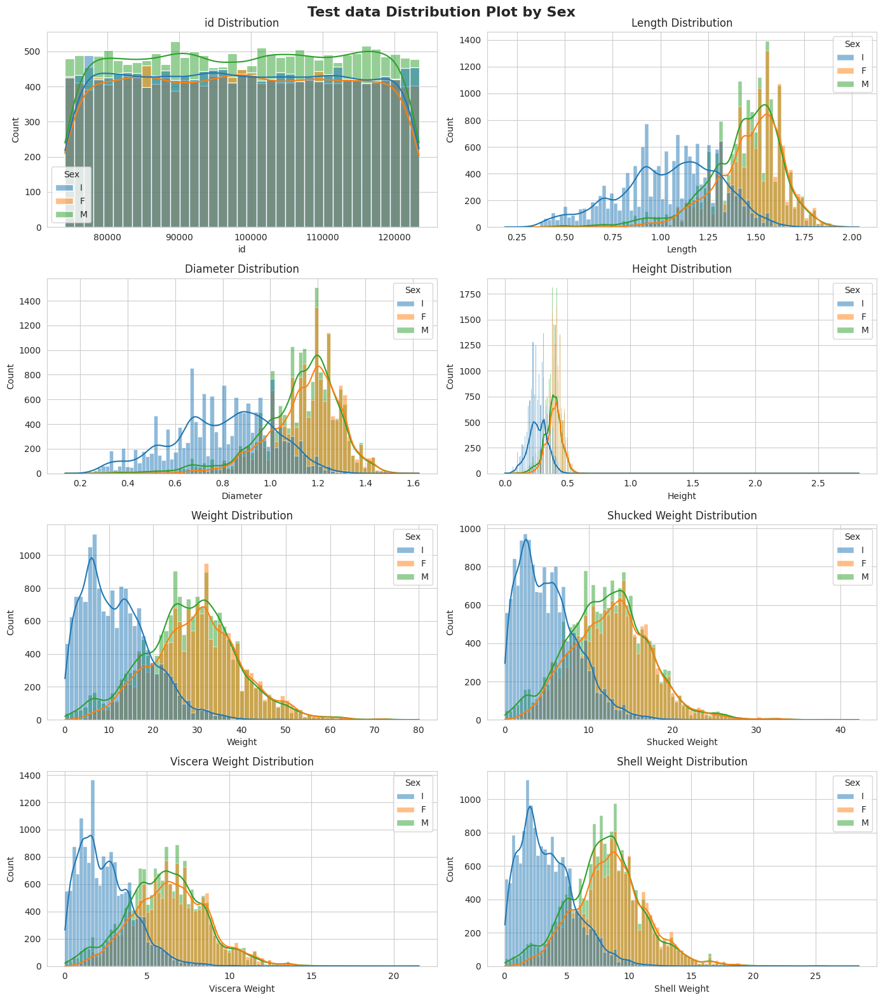

In [ ]:
def plot_distribution(df, hue, title='', drop_cols=[]):
    sns.set_style('whitegrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_cols = 2
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(14, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.histplot(data=df, x=var_name, kde=True, ax=ax, hue=hue) # sns.distplot(df_train[var_name], kde=True, ax=ax, label='Train')
        ax.set_title(f'{var_name} Distribution')

    fig.suptitle(f'{title} Distribution Plot by {hue}', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()

plot_distribution(df_train, hue='Sex', title='Train data', drop_cols=['is_generated'])
plot_distribution(df_test, hue='Sex', title='Test data', drop_cols=['is_generated'])

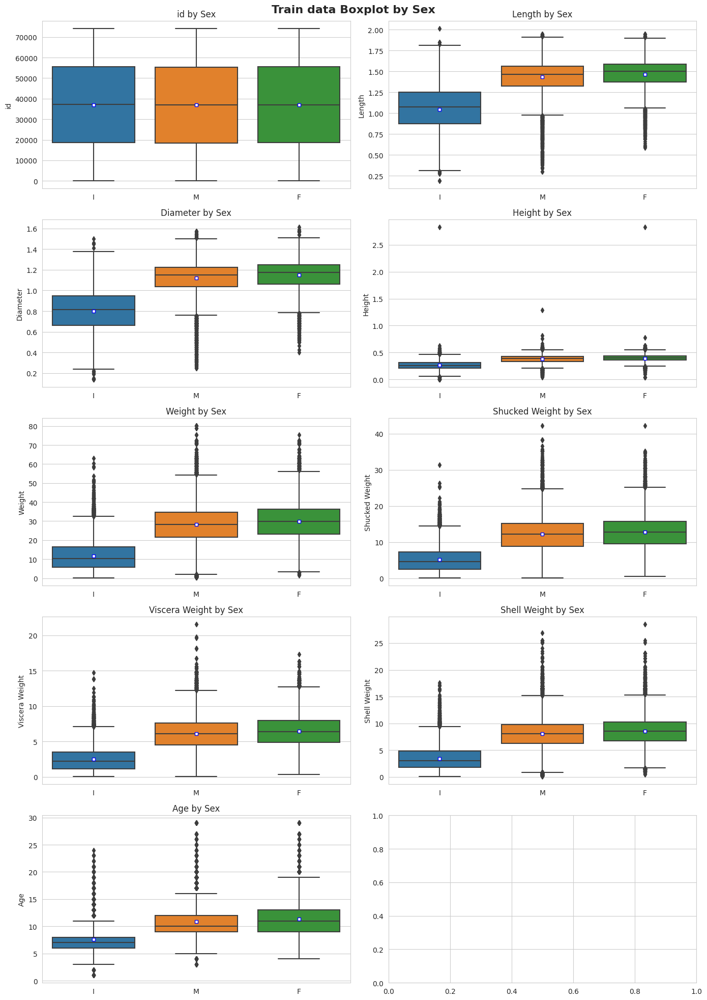

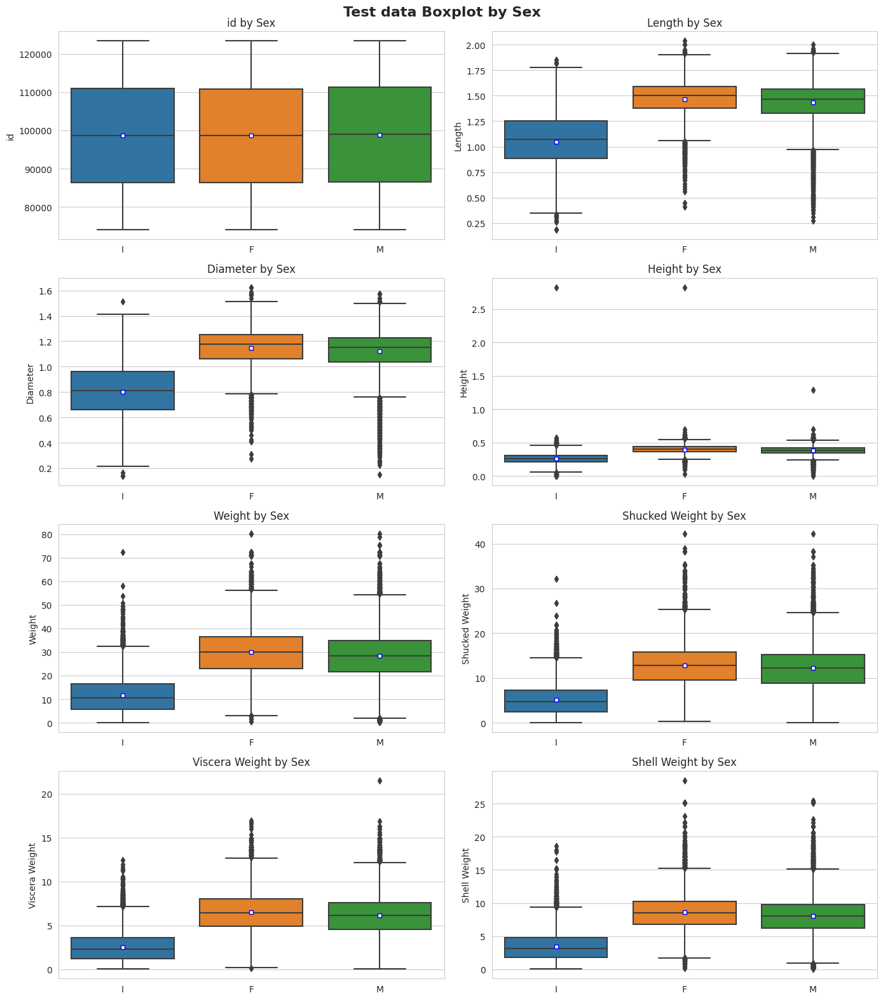

In [ ]:
def plot_boxplot(df, hue, title='', drop_cols=[], n_cols=3):
    sns.set_style('whitegrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(14, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.boxplot(data=df, x=hue, y=var_name, ax=ax, showmeans=True,
                    meanprops={"marker":"s","markerfacecolor":"white", "markeredgecolor":"blue", "markersize":"5"})
        ax.set_title(f'{var_name} by {hue}')
        ax.set_xlabel('')

    fig.suptitle(f'{title} Boxplot by {hue}', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()

plot_boxplot(df_train, hue='Sex', title='Train data', drop_cols=['is_generated'], n_cols=2)
plot_boxplot(df_test, hue='Sex', title='Test data', drop_cols=['is_generated'], n_cols=2)

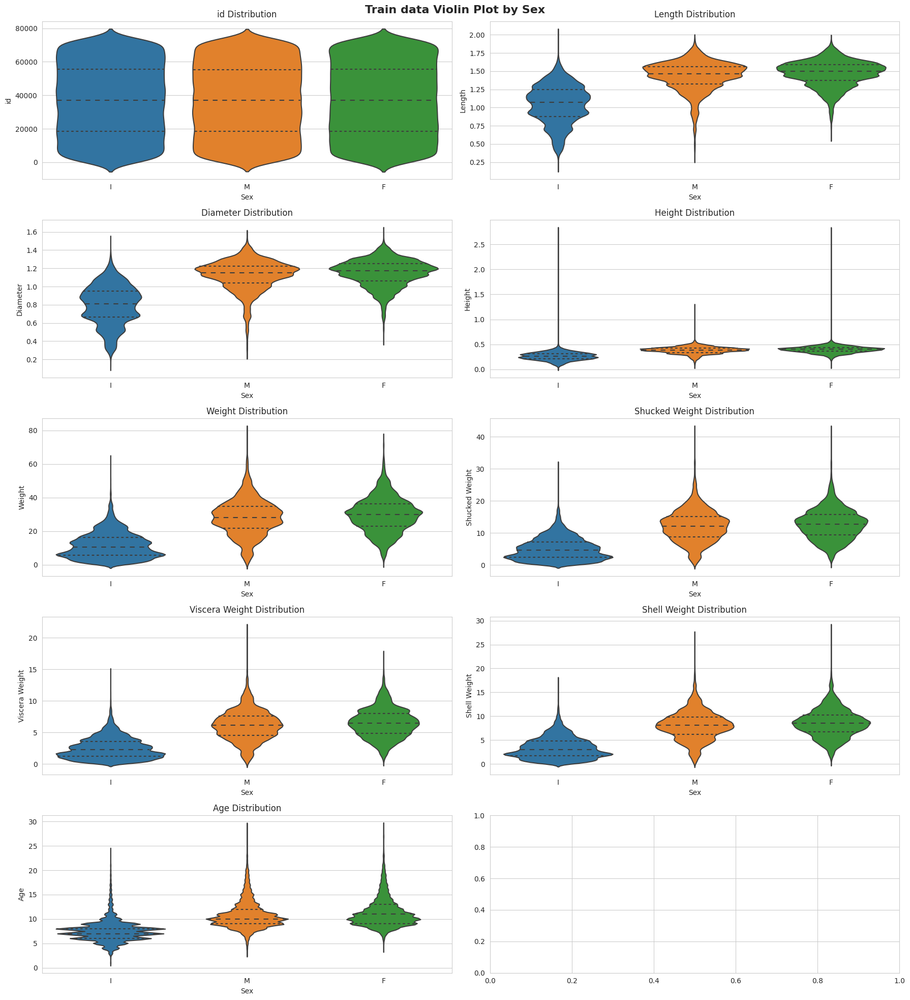

In [ ]:
def plot_violinplot(df, hue, title='', drop_cols=[], n_cols=2):
    sns.set_style('whitegrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.violinplot(data=df, x=hue, y=var_name, ax=ax, inner='quartile')
        ax.set_title(f'{var_name} Distribution')

    fig.suptitle(f'{title} Violin Plot by {hue}', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()

plot_violinplot(df_train, hue='Sex', title='Train data', drop_cols=['is_generated'], n_cols=2)

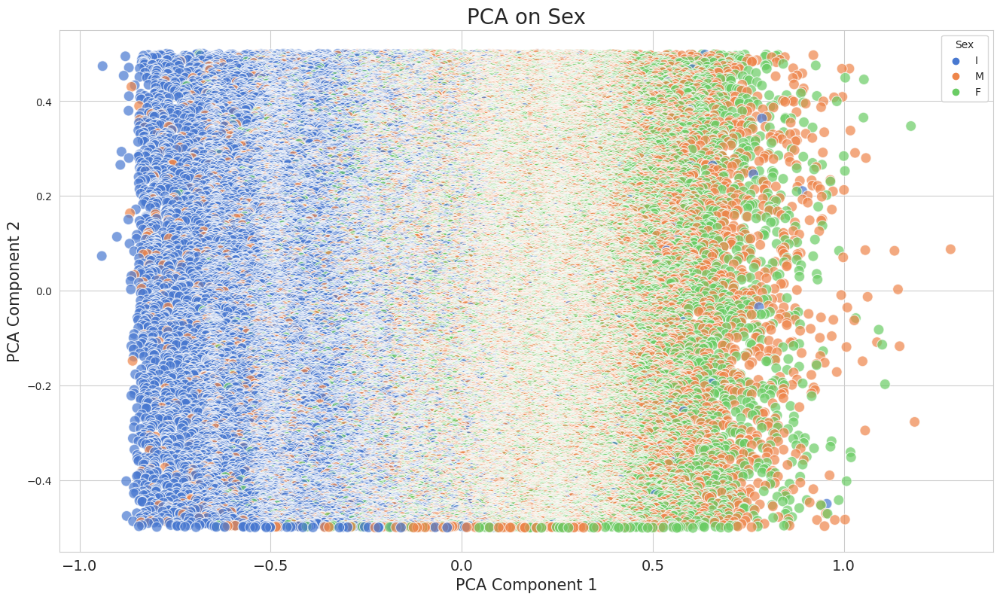

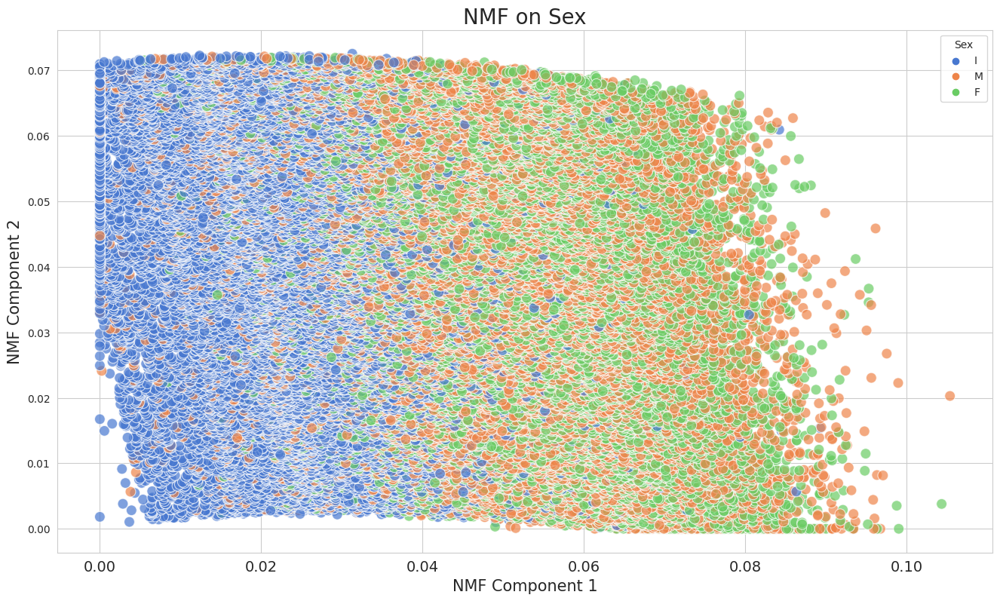

In [ ]:
class Decomp:
    def __init__(self, n_components, method="pca", scaler_method='standard'):
        self.n_components = n_components
        self.method = method
        self.scaler_method = scaler_method

    def dimension_reduction(self, df):

        X_reduced = self.dimension_method(df)
        df_comp = pd.DataFrame(X_reduced, columns=[f'{self.method.upper()}_{_}' for _ in range(self.n_components)], index=df.index)
        return df_comp

    def dimension_method(self, df):

        X = self.scaler(df)
        if self.method == "pca":
            pca = PCA(n_components=self.n_components, random_state=0)
            X_reduced = pca.fit_transform(X)
            self.comp = pca
        elif self.method == "nmf":
            nmf = NMF(n_components=self.n_components, random_state=0)
            X_reduced = nmf.fit_transform(X)
        else:
            raise ValueError(f"Invalid method name: {method}")

        return X_reduced

    def scaler(self, df):

        _df = df.copy()

        if self.scaler_method == "standard":
            return StandardScaler().fit_transform(_df)
        elif self.scaler_method == "minmax":
            return MinMaxScaler().fit_transform(_df)
        elif self.scaler_method == None:
            return _df.values
        else:
            raise ValueError(f"Invalid scaler_method name")

    def get_columns(self):
        return [f'{self.method.upper()}_{_}' for _ in range(self.n_components)]

    def get_explained_variance_ratio(self):
        return np.sum(self.comp.explained_variance_ratio_)

    def transform(self, df):
        X = self.scaler(df)
        X_reduced = self.comp.transform(X)
        df_comp = pd.DataFrame(X_reduced, columns=[f'{self.method.upper()}_{_}' for _ in range(self.n_components)], index=df.index)

        return df_comp

    def decomp_plot(self, tmp, label, hue='genre'):
        plt.figure(figsize = (16, 9))
        sns.scatterplot(x = f"{label}_0", y = f"{label}_1", data=tmp, hue=hue, alpha=0.7, s=100, palette='muted');

        plt.title(f'{label} on {hue}', fontsize = 20)
        plt.xticks(fontsize = 14)
        plt.yticks(fontsize = 10);
        plt.xlabel(f"{label} Component 1", fontsize = 15)
        plt.ylabel(f"{label} Component 2", fontsize = 15)


data = df_train.drop(['Sex', 'Age'], axis=1)
for method in ['pca', 'nmf']:
    decomp = Decomp(n_components=2, method=method, scaler_method='minmax')
    decomp_feature = decomp.dimension_reduction(data)
    decomp_feature = pd.concat([df_train[['Sex']], decomp_feature], axis=1)
    decomp.decomp_plot(decomp_feature, method.upper(), 'Sex')

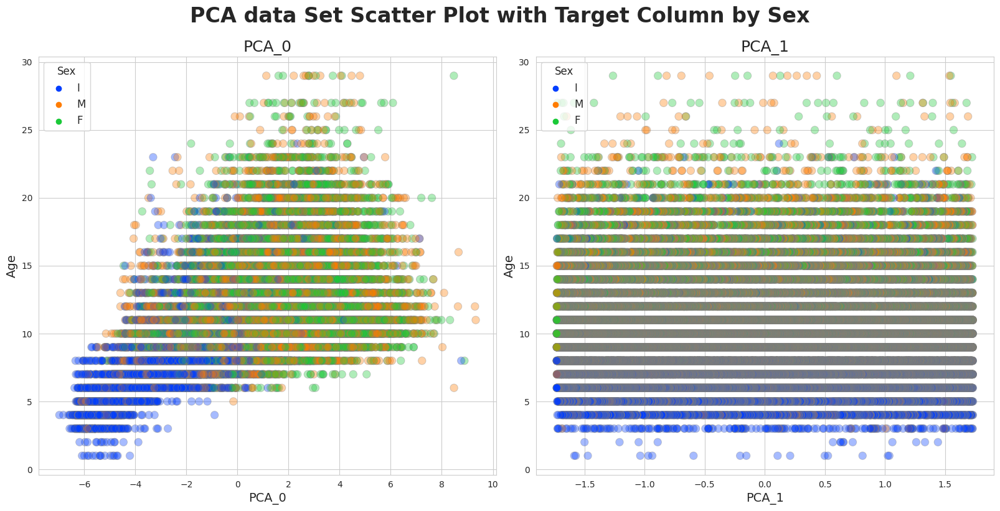

In [ ]:
def plot_scatter_with_fixed_col(df, fixed_col, hue=False, drop_cols=[], size=10, title=''):
    sns.set_style('whitegrid')

    if hue:
        cols = df.columns.drop([hue, fixed_col] + drop_cols)
    else:
        cols = df.columns.drop([fixed_col] + drop_cols)
    n_cols = 2
    n_rows = 1
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(size, size/n_cols*n_rows), sharex=False, sharey=False)
    fig.suptitle(f'{title} Set Scatter Plot with Target Column by {hue}', fontsize=24, fontweight='bold', y=1.01)

    for i, col in enumerate(cols):
        n_row = i // n_cols
        n_col = i % n_cols
        ax = axes[n_col]

        ax.set_xlabel(f'{col}', fontsize=14)
        ax.set_ylabel(f'{fixed_col}', fontsize=14)

        # Plot the scatterplot
        if hue:
            sns.scatterplot(data=df, x=col, y=fixed_col, hue=hue, ax=ax,
                            s=80, edgecolor='gray', alpha=0.35, palette='bright')
            ax.legend(title=hue, title_fontsize=12, fontsize=12) # loc='upper right'
        else:
            sns.scatterplot(data=df, x=col, y=fixed_col, ax=ax,
                            s=80, edgecolor='gray', alpha=0.35)

        ax.tick_params(axis='both', which='major', labelsize=10)
        ax.set_title(f'{col}', fontsize=18)

    plt.tight_layout(pad=0.5, h_pad=0.5, w_pad=0.5)
    plt.show()


decomp = Decomp(n_components=2, method='pca', scaler_method='standard')
decomp_feature = decomp.dimension_reduction(data)
decomp_feature = pd.concat([df_train[['Sex', 'Age']], decomp_feature], axis=1)
plot_scatter_with_fixed_col(decomp_feature, fixed_col=target_col, hue='Sex', drop_cols=[], size=16, title='PCA data')

## Feature Engineering

In [ ]:
df_train['Sex'].replace(['I', 'M', 'F'],
                  [0, 1, 2], inplace=True)

df_train.drop(columns = "id", inplace = True)
df_train.drop(columns = "is_generated", inplace = True)

df_train.head()

,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
0,0,1.5250,1.1750,0.3750,28.973189,12.728926,6.647958,8.348928,9
1,0,1.1000,0.8250,0.2750,10.418441,4.521745,2.324659,3.401940,8
2,1,1.3875,1.1125,0.3750,24.777463,11.339800,5.556502,6.662133,9
3,2,1.7000,1.4125,0.5000,50.660556,20.354941,10.991839,14.996885,11
4,0,1.2500,1.0125,0.3375,23.289114,11.977664,4.507570,5.953395,8


# Function of getting x and y for train and testing

In [ ]:
def get_xy(dataframe, y_label, x_labels=None):
  dataframe = copy.deepcopy(dataframe)
  if x_labels is None:
    X = dataframe[[c for c in dataframe.columns if c!=y_label]].values
  else:
    if len(x_labels) == 1:
      X = dataframe[x_labels[0]].values.reshape(-1, 1)
    else:
      X = dataframe[x_labels].values

  y = dataframe[y_label].values.reshape(-1, 1)
  data = np.hstack((X, y))

  return data, X, y

# Spiliting Data into train, validation and test

In [ ]:
train, val, test = np.split(df_train.sample(frac=1), [int(0.6*len(df_train)), int(0.8*len(df_train))])
_, X_train_all, y_train_all = get_xy(train, "Age", x_labels=df_train.columns[:-1])
y_train_all = (y_train_all - int(np.mean(y_train_all)))/np.std(y_train_all)

_, X_val_all, y_val_all = get_xy(val, "Age", x_labels=df_train.columns[:-1])

_, X_test_all, y_test_all = get_xy(test, "Age", x_labels=df_train.columns[:-1])
y_test_all = (y_test_all - int(np.mean(y_test_all)))/np.std(y_test_all)

# define a Linear Regression Model

In [ ]:
reg = LinearRegression()

# Fitting Data to Model

In [ ]:
reg.fit( X_train_all, y_train_all)

LinearRegression()

# Testing the outputs

In [ ]:
y_pred_lr = reg.predict(X_test_all)

lr_score = reg.score(X_test_all, y_test_all)

def MSE(y_pred, y_real):
  return (np.square(y_pred - y_real)).mean()

mse = MSE(y_pred_lr, y_test_all)

print(f"The Score is {lr_score}")
print(f"The MSE is {mse}")

The Score is 0.5508400527667336
The MSE is 0.4491599472332664


## Trying another method

In [ ]:
from sklearn.linear_model import SGDRegressor

sgd_reg = SGDRegressor(max_iter=50, penalty=None, eta0=0.1)
sgd_reg.fit(X_train_all, y_train_all)

SGDRegressor(eta0=0.1, max_iter=50, penalty=None)

## Testing the output

In [ ]:
y_pred_sgd = sgd_reg.predict(X_test_all)
sgd_score = sgd_reg.score(X_test_all, y_test_all)

sgd_mse = MSE(y_pred_sgd, y_test_all)

print(f"The Score is {sgd_score}")
print(f"The MSE is {sgd_mse}")

The Score is -4.799249821084813e+24
The MSE is 4.7992498210860455e+24


# Analyzing outputs

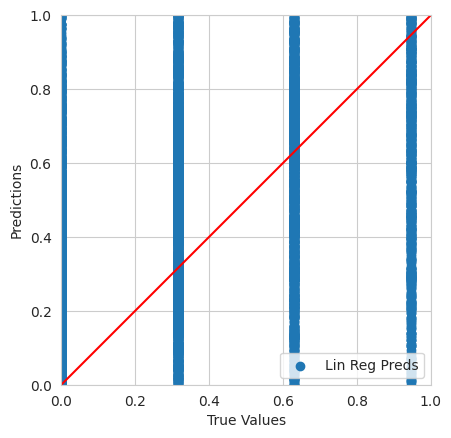

In [ ]:
ax = plt.axes(aspect="equal")
plt.scatter(y_test_all, y_pred_lr, label="Lin Reg Preds")
#plt.scatter(y_test_all, y_pred_sgd, label="sgd Preds")
plt.xlabel("True Values")
plt.ylabel("Predictions")
lims = [0, 1]
plt.xlim(lims)
plt.ylim(lims)
plt.legend()
_ = plt.plot(lims, lims, c="red")

# Regression with Neural Network

Spliting, Scaling, defining and fitting model

In [ ]:
from sklearn.datasets import make_regression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from keras.layers import Dense
from keras.models import Sequential
from keras.optimizers import SGD
from matplotlib import pyplot

# reshape 1d arrays to 2d arrays
trainy = y_train_all.reshape(len(y_train_all), 1)
testy = y_test_all.reshape(len(y_test_all), 1)
# created scaler
scaler = StandardScaler()
# fit scaler on training dataset
scaler.fit(trainy)
# transform training dataset
trainy = scaler.transform(trainy)
# transform test dataset
testy = scaler.transform(testy)
# define model
model = Sequential()
model.add(Dense(25, input_dim=8, activation='relu', kernel_initializer='he_uniform'))
model.add(Dense(1, activation='linear'))
# compile model
model.compile(loss='mean_squared_error', optimizer=SGD(lr=0.01, momentum=0.9))
# fit model
history = model.fit(X_train_all, trainy, validation_data=(X_val_all, y_val_all), epochs=100, verbose=0)


Testing the outputs

In [ ]:
from sklearn.metrics import mean_squared_error

y_pred = model.predict(X_test_all)
mse_test = mean_squared_error(testy,y_pred)
print(mse_test)

463/463 [==============================] - 0s 820us/step
0.5564518467900805


Analyzing outputs

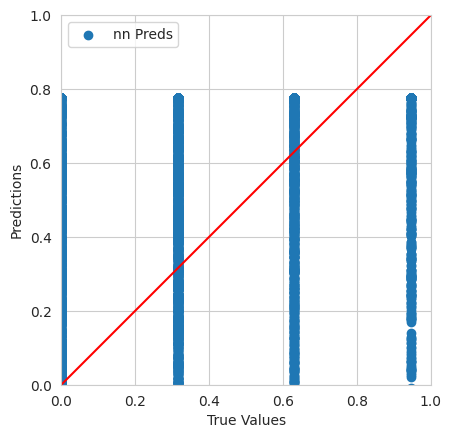

In [ ]:
ax = plt.axes(aspect="equal")
plt.scatter(y_test_all, y_pred, label="nn Preds")
#plt.scatter(y_test_all, y_pred_sgd, label="sgd Preds")
plt.xlabel("True Values")
plt.ylabel("Predictions")
lims = [0, 1]
plt.xlim(lims)
plt.ylim(lims)
plt.legend()
_ = plt.plot(lims, lims, c="red")

# Calculating the output of neural net manually(mathemacialy)

Extracting weights and biases

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler



#input to hidden
layer_1_weights = model.layers[0].get_weights()[0]
layer_1_biases = model.layers[0].get_weights()[1]

#hidden to output
layer_2_weights = model.layers[1].get_weights()[0]
layer_2_biases = model.layers[1].get_weights()[1]

Activation function defining

In [ ]:
def relu(X):
   return np.maximum(0,X)


def linear(x):
    ''' y = f(x) It returns the input as it is'''
    return x


calculating output

In [ ]:
inputs = np.transpose(X_test_all)
Wh1 = np.transpose(layer_1_weights)
bh1 = layer_1_biases.reshape(25,1)
Z1 = np.matmul(Wh1, inputs) + bh1
h1 = relu(Z1)

Wh2 = np.transpose(layer_2_weights)
bh2 = layer_2_biases.reshape(1,1)
Z2 = np.matmul(Wh2, h1) + bh2
h2 = linear(Z2)

output = np.transpose(h2)

testing outputs

In [ ]:
mse_test = mean_squared_error(testy,output)
print(mse_test)


0.5564518443498918
